Импорт библиотек

In [1]:
import os
import glob
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag
from nltk.chunk import conlltags2tree, tree2conlltags
from pprint import pprint
import networkx as nx
import matplotlib.pyplot as plt
from nltk.corpus import conll2000
import spacy
from spacy import displacy
from collections import Counter
import en_core_web_sm
from nltk.corpus import stopwords
#679 имён в вики


In [2]:
import re 
my_hobbits = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_hobbits.txt','r',encoding = 'utf-8')
hobbits = []
for elem in my_hobbits.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        hobbits.append(elem.lower().split()[0])

d_hobbits = dict.fromkeys(hobbits, 'hobbit')

my_dwarves = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_dwarves.txt','r',encoding = 'utf-8')
dwarves = []

for elem in my_dwarves.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        dwarves.append(elem.lower().split()[0])
d_dwarves = dict.fromkeys(dwarves, 'dwarf')
my_elves = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_elves.txt','r',encoding = 'utf-8')
elves = []
for elem in my_elves .readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        elves.append(elem.lower().split()[0])
d_elves = dict.fromkeys(elves, 'elf')
my_maiar = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_maiar.txt','r',encoding = 'utf-8')
maiar = []
for elem in my_maiar.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        maiar.append(elem.lower().split()[0])
d_maiar = dict.fromkeys(maiar, 'maiar')
my_orcs = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_orcs.txt','r',encoding = 'utf-8')
orcs = []
for elem in my_orcs.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        orcs.append(elem.lower().split()[0])
d_orcs = dict.fromkeys(orcs, 'orc')
my_men = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_men.txt','r',encoding = 'utf-8')
men = []
for elem in my_men.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        men.append(elem.lower().split()[0])
d_men = dict.fromkeys(men, 'men')
my_valars = open(r'C:\Users\NYashch\nyashch-projects\Diploma\my_valars.txt','r',encoding = 'utf-8')
valars = []
for elem in my_valars.readlines():
    if len(elem) > 4:
        elem = elem.replace("\n","")
        elem = elem.replace("\r","")
        valars.append(elem.lower())
d_valars = dict.fromkeys(valars, 'valar')
ainur = ["ainur",'aluin','danuin','fanuin','morgoth','ranuin']
d_ainur = dict.fromkeys(ainur, 'ainur')
barlogs = ['gothmog','lungorthin','osombauko']
d_barlogs = dict.fromkeys(barlogs, 'barlog')
dragons = ['ancalagon','chrysophylax','glaurung','gostir','scatha','smaug','urulókë']
d_dragons = dict.fromkeys(dragons, 'dragon')
eagles = ['gwaihir','landroval','meneldor','thornhoth','thorondor','windlord']
d_eagles = dict.fromkeys(eagles, 'eagle')
ents = ['beechbone','entings','entmaidens','entmoot','entwives','fimbrethil','leaflock','onodrim','quickbeam','skinbark','treebeard']
d_ents = dict.fromkeys(ents, 'ent')
half_elven = ['ardamir eärendil','arwen','dior','eärendil','elladan','elrohir','elrond','elros','elurín','elwing','undómiel']
d_half_elven = dict.fromkeys(half_elven, 'half_elf')
werewolves = ['carcharoth','draugluin','thû']
d_werewolves = dict.fromkeys(werewolves, 'werewolf')
trolls = ['bert','olog-hai','tom','william']
d_trolls = dict.fromkeys(trolls, 'troll')


In [3]:

all_names = hobbits + dwarves +elves+maiar+orcs+men+valars+ainur+barlogs+dragons+eagles+ents+half_elven+werewolves+trolls
names = list(set(all_names))
names.append('sam')

In [4]:
sent_file = open(r'C:\Users\NYashch\nyashch-projects\all_sentences.txt','r',encoding = 'utf-8')
all_sentences = [line.strip() for line in sent_file]
sent_file.close()
tolkien_text = ''.join(all_sentences)

In [23]:
def flatten(input_list):
    '''
    A function to flatten complex list.
    :param input_list: The list to be flatten
    :return: the flattened list.
    '''

    flat_list = []
    for i in input_list:
        if type(i) == list:
            flat_list += flatten(i)
        else:
            flat_list += [i]

    return flat_list


def name_entity_recognition(sentence,names_list):
    '''
    A function to retrieve name entities in a sentence.
    :param sentence: the sentence to retrieve names from.
    :return: a name entity list of the sentence.
    '''

    doc = nlp(sentence)
    # retrieve person and organization's name from the sentence
    name_entity = [x for x in doc.ents if x.label_ in ['PERSON']]
    # convert all names to lowercase and remove 's in names
    name_entity = [str(x).lower().replace("'s","") for x in name_entity]
    # split names into single words ('Harry Potter' -> ['Harry', 'Potter'])
    name_entity = [x.split(' ') for x in name_entity]
    # flatten the name list
    name_entity = flatten(name_entity)
    # remove name words that are less than 3 letters to raise recognition accuracy
    name_entity = [x for x in name_entity if len(x) >= 3]
    # remove name words that are in the set of 4000 common words
    name_entity = [x for x in name_entity if x not in common_words]
    # remove name words that are in the set of races
    name_entity = [x for x in name_entity if x not in races]
    #print(name_entity)
    for name in name_entity:
        names_list.append(name)
    return name_entity

In [11]:
cm_file = open(r'C:\Users\NYashch\nyashch-projects\Diploma\common_words.txt', 'r')
cm_lines = [line.strip() for line in cm_file]
cm_file.close()
common_words = []
for word in cm_lines:
    all_cm = word.split(',')
    for cm in all_cm:
           common_words.append(cm)
common_words.append('the')
races = ['trolls','troll', 'werewolves','werewolf', 'half_elven','elf', 'ents','ent', 'eagles','eagle','dragons','dragon', 'barlogs','barlog','ainur','hobbit','hobbits','dwarves','dwarf', 'elves', 'maiar', 'orcs', 'orc', 'valar','valars']

In [6]:
import en_core_web_sm

nlp = en_core_web_sm.load()

In [24]:
spacy_ner = []
for sent in all_sentences:
    name_entity_recognition(sent,spacy_ner)

In [14]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag

In [16]:
def preprocess(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent

In [21]:
nltk_iobs = []
for sent in all_sentences:
    iob = preprocess(sent)
    for i in iob:
        if list(i)[1] =='NNP':
            nltk_iobs.append(list(i)[0])
            #print((list(i)[0]))


In [26]:
print(len(set(spacy_ner)))
print(len(set(nltk_iobs)))

1196
3261


Создаём файл с текстом.

In [2]:

directory =r"C:\Users\NYashch\nyashch-projects\Diploma\Books\The Hobbit"
os.chdir(directory)
for root, dirs, files in os.walk(".", topdown = False):
    with open("hobbit.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:
                outfile.write(infile.read())
hobbit_file = open('hobbit.txt','r',encoding = 'utf-8')
hobbit_text = ''.join(hobbit_file.readlines())

In [3]:

directory = r'C:\Users\NYashch\nyashch-projects\Diploma\Books\Index'
os.chdir(r'C:\Users\NYashch\nyashch-projects\Diploma\Books\Index')
for root, dirs, files in os.walk(".", topdown = False):
    with open("Index.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:   #файл=перечень имён+био
                outfile.write(infile.read())
index_file = open('Index.txt','r',encoding = 'utf-8')
index_text = ''.join(index_file.readlines())

In [4]:

directory = r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Fellowship Of The Ring'
os.chdir(r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Fellowship Of The Ring')
for root, dirs, files in os.walk(".", topdown = False):
    with open("The Fellowship Of The Ring.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:
                outfile.write(infile.read())
fellowship_file = open('The Fellowship Of The Ring.txt','r',encoding = 'utf-8') #1b
fellowship_text = ''.join(fellowship_file.readlines())

In [5]:

directory = r'C:\Users\NYashch\nyashch-projects\Diploma\Books\Two Towers'
os.chdir(r'C:\Users\NYashch\nyashch-projects\Diploma\Books\Two Towers')
for root, dirs, files in os.walk(".", topdown = False):
    with open("Two Towers.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:
                outfile.write(infile.read())
towers_file = open('Two Towers.txt','r',encoding = 'utf-8') #2b
towers_text = ''.join(towers_file.readlines())

In [6]:

directory = r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Return Of The King'
os.chdir(r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Return Of The King')
for root, dirs, files in os.walk(".", topdown = False):
    with open("The Return Of The King.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:
                outfile.write(infile.read())
return_file = open('The Return Of The King.txt','r',encoding = 'utf-8') #3b
return_text = ''.join(return_file.readlines())

In [7]:

directory = r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Silmarillion'
os.chdir(r'C:\Users\NYashch\nyashch-projects\Diploma\Books\The Silmarillion')
for root, dirs, files in os.walk(".", topdown = False):
    with open("The Silmarillion.txt", "wb") as outfile:
        for name in files:
            with open(name, "rb") as infile:
                outfile.write(infile.read())
silmarillion_file = open('The Silmarillion.txt','r',encoding = 'utf-8') #4b
silmarillion_text = ''.join(silmarillion_file.readlines())

In [8]:
tolkien_text = silmarillion_text+return_text+towers_text+fellowship_text+hobbit_text #файл со всем текстом всех книг

Препроцессинг

In [9]:
def preprocess(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent

Chunking с NLTK

In [10]:
pattern = 'NP: {<DT>?<JJ>*<NN>}'
  #NP: {<DT|PP\$>?<JJ>*<NN>}   # chunk determiner/possessive, adjectives and noun
      #{<NNP>+}                # chunk sequences of proper nouns
#pattern = 'NP: {<NN>}'


In [11]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\NYashch\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [12]:
cp = nltk.RegexpParser(pattern)
cs = cp.parse(preprocess(index_text))

iob_tagged = tree2conlltags(cs)
pprint(iob_tagged)

[('\ufeff', 'VB', 'O'),
 ('A', 'DT', 'O'),
 ('Abyss', 'NNP', 'O'),
 ('The', 'DT', 'O'),
 ('low', 'JJ', 'O'),
 ('places', 'NNS', 'O'),
 ('of', 'IN', 'O'),
 ('the', 'DT', 'O'),
 ('Timeless', 'NNP', 'O'),
 ('Halls', 'NNP', 'O'),
 ('(', '(', 'O'),
 ('q.v', 'FW', 'O'),
 ('.', '.', 'O'),
 (')', ')', 'O'),
 ('of', 'IN', 'O'),
 ('Iliivatar', 'NNP', 'O'),
 ('.', '.', 'O'),
 ('(', '(', 'O'),
 ('N', 'NNP', 'O'),
 ('17', 'CD', 'O'),
 (';', ':', 'O'),
 ('O', 'NNP', 'O'),
 ('17', 'CD', 'O'),
 (')', ')', 'O'),
 ('Accursed', 'VBD', 'O'),
 ('Years', 'VBZ', 'O'),
 ('The', 'DT', 'O'),
 ('Dark', 'NNP', 'O'),
 ('Years', 'NNP', 'O'),
 ('(', '(', 'O'),
 ('q.v.', 'NN', 'B-NP'),
 (')', ')', 'O'),
 ('.', '.', 'O'),
 ('(', '(', 'O'),
 ('A', 'DT', 'O'),
 ('819', 'CD', 'O'),
 (';', ':', 'O'),
 ('B3', 'NNP', 'O'),
 ('61', 'CD', 'O'),
 (';', ':', 'O'),
 ('C3', 'NNP', 'O'),
 ('67', 'CD', 'O'),
 (';', ':', 'O'),
 ('D3', 'NNP', 'O'),
 ('52', 'CD', 'O'),
 (')', ')', 'O'),
 ('Adaldrida', 'NNP', 'O'),
 ('Brandybuck', 'NNP

In [13]:
nnp = []
for elem in iob_tagged:
    if elem[1] =='NNP':
        nnp.append(elem[0])
    if elem[1] =='NNPS':
        nnp.append(elem[0])
nnp = list(set(nnp)) #all entities
nltk.download('stopwords')
stops = list(set(stopwords.words('english')))
for i in nnp:
    if i in stops:
        nnp.remove(i)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\NYashch\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Собираем в граф


In [34]:
g = nx.Graph()
sentences = hobbit_text.split('.') #делим текст на предложения
for char in nnp: #для персонажа в списке имён
    for sent in sentences: #для предложения среди предложений
        sent_list = sent.split() #список предложений
        if char in sent_list: #если в предложении есть пресонаж
            i = 0 
            for i in range (len(nnp)): #перебираем весь список имён
                    if nnp[i] in sent_list: #если имя под текущим индексом есть в даном предложении
                        if nnp[i] != char: #при этом оно не ровно исследуемому персонажу
                            given_chars = list(g.nodes) # персонажи, уже имеющиеся в графе
                            if nnp[i] not in given_chars:
                                g.add_node(char) #добавляем узел с таким названием
                                g.add_node(nnp[i]) #добавляем узел с найденным именем (совстречаемым)
                                g.add_edge(char,nnp[i]) #добавляем связь между ними
                            if char not in given_chars:
                                g.add_node(char) #добавляем узел с таким названием
                                g.add_node(nnp[i]) #добавляем узел с найденным именем (совстречаемым)
                                g.add_edge(char,nnp[i]) #добавляем связь между ними
                            else:
                                g.add_edge(char,nnp[i]) #добавляем связь между ними

SyntaxError: unexpected EOF while parsing (<ipython-input-34-ee53e3c7035a>, line 21)

In [29]:
from grave import grave

In [30]:
from grave import plot_network

In [35]:
np = nx.Graph()
np.add_nodes_from(nnp)


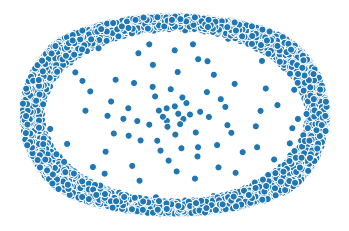

In [36]:
#pos = nx.spring_layout(g)
#nx.draw(g, pos=pos, with_labels=True,label_size=1,node_size=20,edge_size=9000)
grave.plot_network(np, layout="spring")

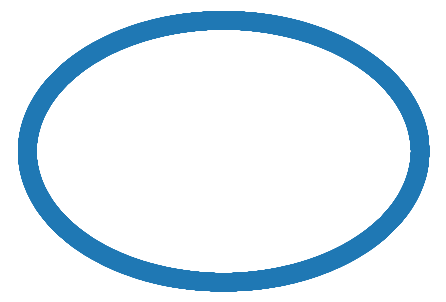

In [39]:
nx.draw_shell(np)

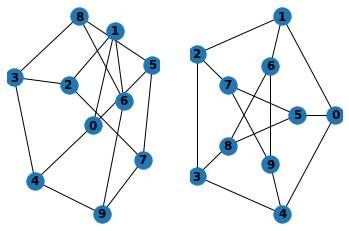

In [28]:
G = nx.petersen_graph()
plt.subplot(121)

nx.draw(G, with_labels=True, font_weight='bold')
plt.subplot(122)

nx.draw_shell(G, nlist=[range(5, 10), range(5)], with_labels=True, font_weight='bold')

In [32]:
print(len(list(g.nodes)))

199


AttributeError: 'Graph' object has no attribute 'array'

Убрать SpaCy, в качестве нодов использовать список имён из индекса


In [29]:
en_core_web_sm.load()

In [35]:
nlp = en_core_web_sm.load()
doc = nlp(hobbit_text)
nnp_spacy = [(X.text, X.label_) for X in doc.ents]
nnp2 = []
for elem in nnp_spacy:
    if elem[1] =='PERSON':
        nnp2.append(elem[0])
    
nnp2 = list(set(nnp2))
print(len(nnp2))
print(len(nnp))
g2 = nx.Graph()
sentences = hobbit_text.split('.')
for char in nnp2:
    for sent in sentences:
        sent_list = sent.split()
        if char in sent_list:
            i = 0
            for i in range (len(nnp2)):
                    if nnp2[i] in sent_list:
                        if nnp2[i] != char:
                            g2.add_node(char)
                            g2.add_node(nnp2[i])
                            g2.add_edge(char,nnp2[i])

nx.draw(g2, with_labels=True,label_size=10,node_size=1,edge_size=11) 


ValueError: [E088] Text of length 1461678 exceeds maximum of 1000000. The v2.x parser and NER models require roughly 1GB of temporary memory per 100,000 characters in the input. This means long texts may cause memory allocation errors. If you're not using the parser or NER, it's probably safe to increase the `nlp.max_length` limit. The limit is in number of characters, so you can check whether your inputs are too long by checking `len(text)`.

In [39]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\NYashch\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [ ]:
import re
index = index_text.split() 
golden_standart = []
races = ['Men','Elves','Dwarves','Easterlings','Hobbits','Orcs','Trolls','Valar','Maiar']
stops = list(set(stopwords.words('english'))) + races
all_char = open(r'C:\Users\NYashch\nyashch-projects\Diploma\all_characters.txt','r',encoding = 'utf-8')
all_char = all_char.readlines()
all_char = [line.rstrip() for line in all_char]

for name in all_char:
    if len(name.split(' ')) > 1:
        for part in name.split(' '):
            all_char.append(part)
        all_char.remove(name)    
        for elem in index_text.split():
            if elem in all_char:
                if len(elem) > 1:
                    if elem not in stops:
                        golden_standart.append([elem,'1'])
            else:
                golden_standart.append([elem,'0'])
import pandas as pd
import numpy as np
from sklearn.feature_extraction import DictVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.linear_model import Perceptron
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report
X = golden_standart
v = DictVectorizer(sparse=False)
X = v.fit_transform(dict(X))
y = tolkien_text.split()

classes = ['1','0']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state=0)
X_train.shape, y_train.shape
per = Perceptron(verbose=10, n_jobs=-1, max_iter=5)
per.partial_fit(X_train, y_train, classes)